<a href="https://colab.research.google.com/github/Hpone-Myat-Min/CloudComputing/blob/master/custom_intruder_detection_model.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!nvidia-smi

Tue Aug 12 02:59:01 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   51C    P8              9W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [2]:
!unzip -q /content/training_images.zip -d /content/custom_data

In [3]:
!wget -O /content/split_train_val.py https://raw.githubusercontent.com/EdjeElectronics/Train-and-Deploy-YOLO-Models/refs/heads/main/utils/train_val_split.py
!python split_train_val.py --datapath="/content/custom_data/" --train_pct=0.9

--2025-08-12 03:00:10--  https://raw.githubusercontent.com/EdjeElectronics/Train-and-Deploy-YOLO-Models/refs/heads/main/utils/train_val_split.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 3203 (3.1K) [text/plain]
Saving to: ‘/content/split_train_val.py’

/content/split_trai 100%[===================>]   3.13K  --.-KB/s    in 0s      

2025-08-12 03:00:10 (53.4 MB/s) - ‘/content/split_train_val.py’ saved [3203/3203]

Created folder at /content/data/train/images.
Created folder at /content/data/train/labels.
Created folder at /content/data/validation/images.
Created folder at /content/data/validation/labels.
Number of image files: 344
Number of annotation files: 344
Images moving to train: 309
Images moving to validation: 35


In [4]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 26.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 125.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 98.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 57.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 13.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 188.7/188.7 MB 5.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 104.5 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu1

In [5]:
import yaml
import os

def create_data_yaml(path_to_classes, path_to_data):
  if not os.path.exists(path_to_classes):
    print("classes.txt file not found!")
    return
  with open(path_to_classes, 'r') as f:
    classes = []
    for line in f.readlines():
      if len(line.strip()) == 0: continue
      classes.append(line.strip())
  num_of_classes = len(classes)

  data = {
      'path': '/content/data',
      'train': 'train/images',
      'val': 'validation/images',
      'nc': num_of_classes,
      'names': classes
  }

  with open(path_to_data, 'w') as f:
    yaml.dump(data, f, sort_keys=False)
  print('Created yaml config file')

  return

path_to_classes = '/content/custom_data/classes.txt'
path_to_data = '/content/data.yaml'

create_data_yaml(path_to_classes, path_to_data)
print("FILE CONTENTS: ")
!cat /content/data.yaml



Created yaml config file
FILE CONTENTS: 
path: /content/data
train: train/images
val: validation/images
nc: 2
names:
- intruder
- jason


In [6]:
!yolo detect train data=/content/data.yaml model=yolo11s.pt epochs=60 imgsz=640

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Ultralytics 8.3.177 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=60, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_widt

In [7]:
!yolo detect predict model=runs/detect/train/weights/best.pt source=data/validation/images save=True

Ultralytics 8.3.177 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11s summary (fused): 100 layers, 9,413,574 parameters, 0 gradients, 21.3 GFLOPs

image 1/35 /content/data/validation/images/02304534-image_7_a.jpg: 640x640 1 jason, 15.6ms
image 2/35 /content/data/validation/images/10212e7e-image_58_a.jpg: 640x640 3 intruders, 15.6ms
image 3/35 /content/data/validation/images/16074e97-image_8_a.jpg: 640x640 1 jason, 15.6ms
image 4/35 /content/data/validation/images/265de44f-image_67.jpg: 640x640 1 intruder, 15.6ms
image 5/35 /content/data/validation/images/35b016de-image_11_c.jpg: 640x640 1 jason, 15.6ms
image 6/35 /content/data/validation/images/37e6b62d-image_73_a.jpg: 640x640 1 intruder, 15.6ms
image 7/35 /content/data/validation/images/458e1a68-image_50.jpg: 640x640 1 intruder, 15.6ms
image 8/35 /content/data/validation/images/4b72c52b-image_64.jpg: 640x640 1 intruder, 15.6ms
image 9/35 /content/data/validation/images/51eade50-image_51.jpg: 640x640 1 intruder, 15

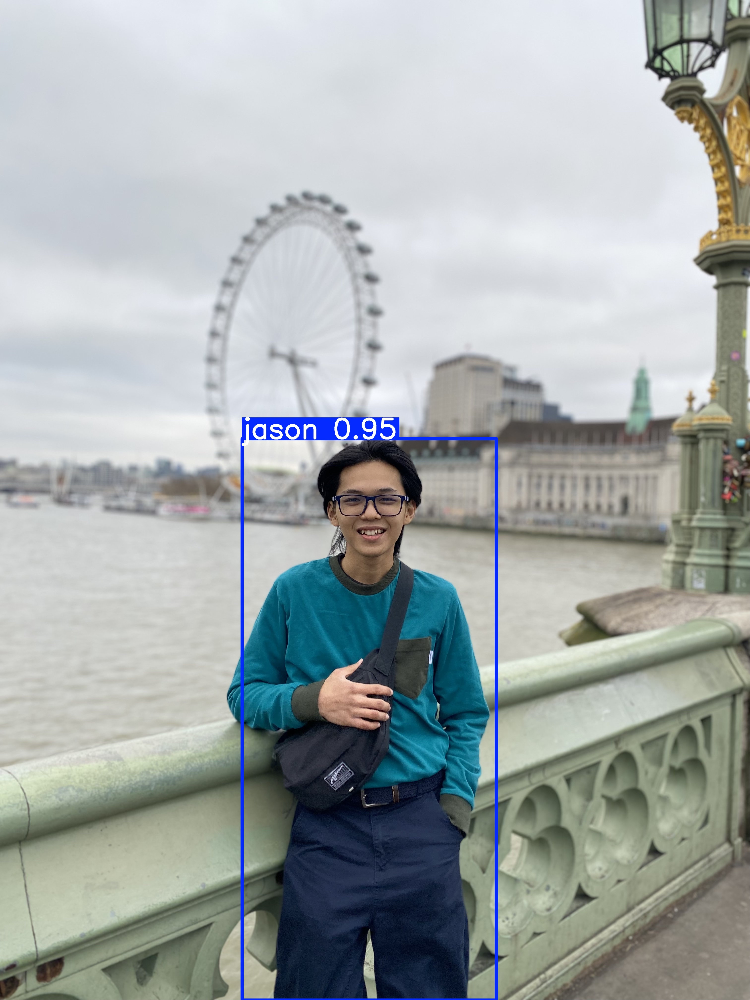

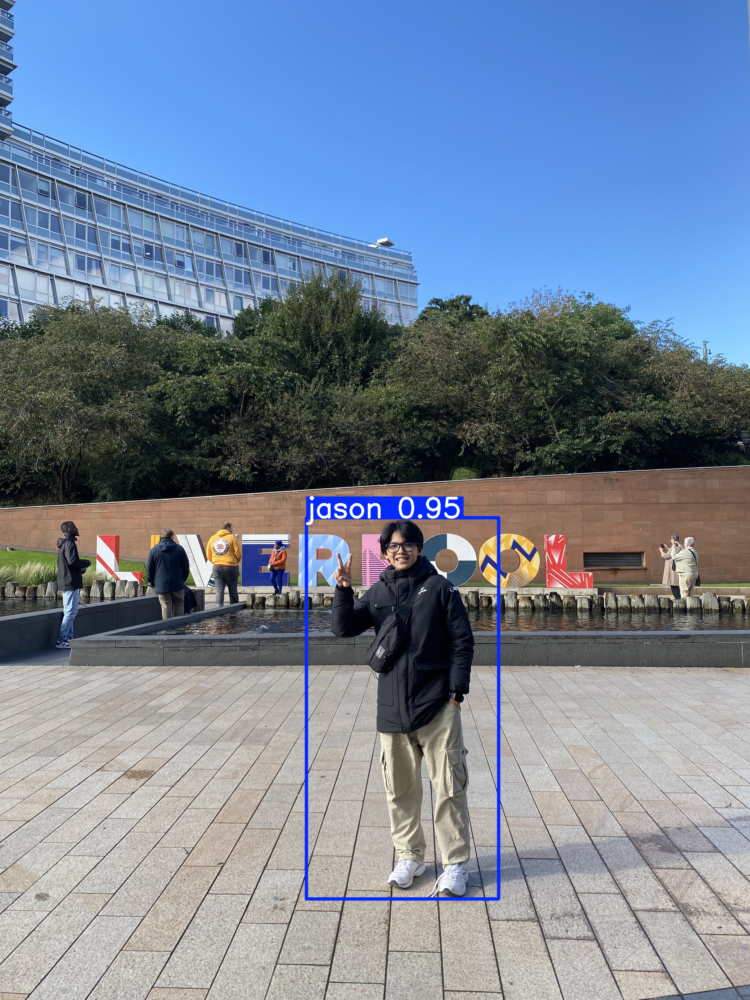

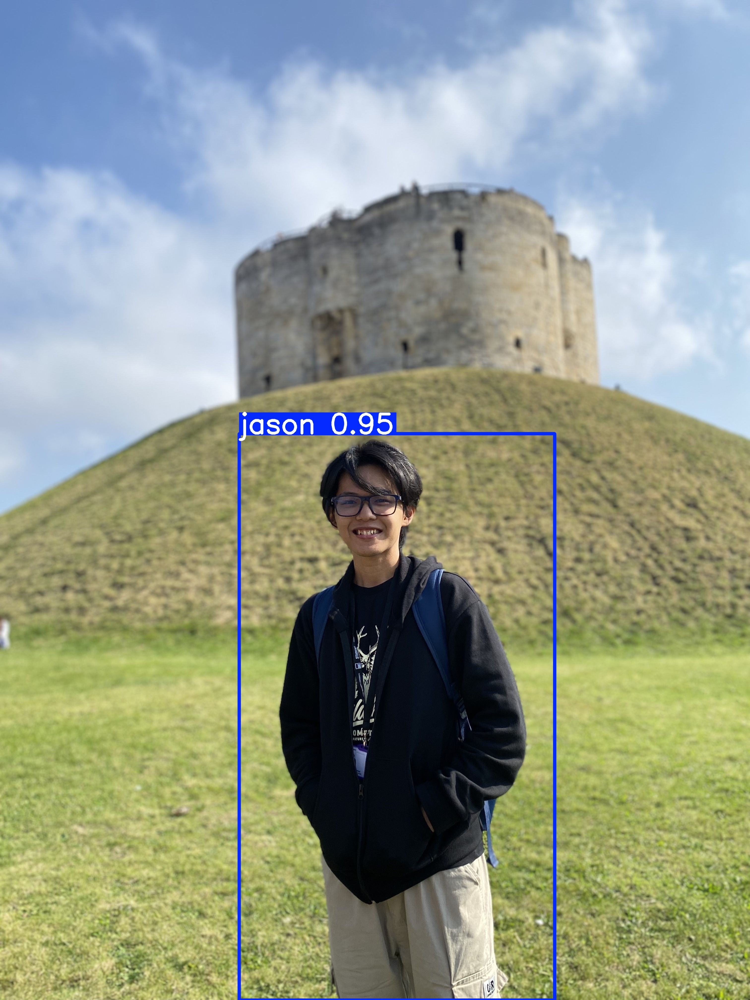

In [11]:
import glob
from IPython.display import Image, display
for image_path in glob.glob(f'/content/runs/detect/predict/*.jpg')[:10]:
  display(Image(filename=image_path, height=400))
  print('\n')

In [8]:
!mkdir /content/custom_model
!cp /content/runs/detect/train/weights/best.pt /content/custom_model/custom_model.pt
!cp -r /content/runs/detect/train/ /content/custom_model

%cd custom_model
!zip /content/custom_model.zip custom_model.pt
!zip -r /content/custom_model.zip train
%cd /content

/content/custom_model
  adding: custom_model.pt (deflated 8%)
  adding: train/ (stored 0%)
  adding: train/results.png (deflated 6%)
  adding: train/BoxP_curve.png (deflated 19%)
  adding: train/confusion_matrix.png (deflated 35%)
  adding: train/val_batch0_labels.jpg (deflated 10%)
  adding: train/BoxR_curve.png (deflated 15%)
  adding: train/train_batch1002.jpg (deflated 10%)
  adding: train/train_batch1.jpg (deflated 7%)
  adding: train/BoxF1_curve.png (deflated 14%)
  adding: train/train_batch0.jpg (deflated 5%)
  adding: train/results.csv (deflated 61%)
  adding: train/BoxPR_curve.png (deflated 26%)
  adding: train/train_batch1001.jpg (deflated 11%)
  adding: train/train_batch2.jpg (deflated 3%)
  adding: train/val_batch1_pred.jpg (deflated 18%)
  adding: train/weights/ (stored 0%)
  adding: train/weights/last.pt (deflated 8%)
  adding: train/weights/best.pt (deflated 8%)
  adding: train/val_batch1_labels.jpg (deflated 18%)
  adding: train/labels_correlogram.jpg (deflated 42%)
  a

In [9]:
from google.colab import files
files.download('/content/custom_model.zip')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [1]:
!mkdir /content/custom_model
!unzip /content/tflite_model.zip -d /content/custom_model

Archive:  /content/tflite_model.zip
   creating: /content/custom_model/custom_model_saved_model/
  inflating: /content/custom_model/custom_model_saved_model/metadata.yaml  
   creating: /content/custom_model/custom_model_saved_model/variables/
  inflating: /content/custom_model/custom_model_saved_model/variables/variables.data-00000-of-00001  
  inflating: /content/custom_model/custom_model_saved_model/variables/variables.index  
   creating: /content/custom_model/custom_model_saved_model/assets/
  inflating: /content/custom_model/custom_model_saved_model/custom_model_float32.tflite  
  inflating: /content/custom_model/custom_model_saved_model/custom_model_float16.tflite  
 extracting: /content/custom_model/custom_model_saved_model/fingerprint.pb  
  inflating: /content/custom_model/custom_model_saved_model/saved_model.pb  


In [2]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 24.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 125.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 84.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 54.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 13.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 188.7/188.7 MB 6.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 105.0 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu1

In [10]:
!yolo export model=/content/custom_model/custom_model.pt format=tflite project=/content/tflite_format_exports

Ultralytics 8.3.177 🚀 Python-3.11.13 torch-2.6.0+cu124 CPU (Intel Xeon 2.20GHz)
💡 ProTip: Export to OpenVINO format for best performance on Intel hardware. Learn more at https://docs.ultralytics.com/integrations/openvino/
YOLO11s summary (fused): 100 layers, 9,413,574 parameters, 0 gradients, 21.3 GFLOPs

PyTorch: starting from '/content/custom_model/custom_model.pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) (1, 6, 8400) (18.3 MB)
E0000 00:00:1754969973.734822   11077 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1754969973.808016   11077 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1754969974.348788   11077 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:17549699

In [11]:
!mkdir /content/tflite_model
!cp -r /content/custom_model/custom_model_saved_model/ /content/tflite_model

%cd tflite_model
!zip -r /content/tflite_model.zip custom_model_saved_model
%cd /content

/content/tflite_model
  adding: custom_model_saved_model/ (stored 0%)
  adding: custom_model_saved_model/custom_model_float32.tflite (deflated 14%)
  adding: custom_model_saved_model/custom_model_float16.tflite (deflated 8%)
  adding: custom_model_saved_model/metadata.yaml (deflated 35%)
  adding: custom_model_saved_model/assets/ (stored 0%)
  adding: custom_model_saved_model/saved_model.pb (deflated 8%)
  adding: custom_model_saved_model/variables/ (stored 0%)
  adding: custom_model_saved_model/variables/variables.index (deflated 25%)
  adding: custom_model_saved_model/variables/variables.data-00000-of-00001 (deflated 44%)
  adding: custom_model_saved_model/fingerprint.pb (stored 0%)
/content


In [12]:
from google.colab import files
files.download('/content/tflite_model.zip')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [13]:
!yolo predict task=detect model=/content/custom_model/custom_model_saved_model/custom_model_float32.tflite imgsz=640

WARNING ⚠️ 'source' argument is missing. Using default 'source=/usr/local/lib/python3.11/dist-packages/ultralytics/assets'.
Ultralytics 8.3.177 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
E0000 00:00:1754970174.028750   11996 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1754970174.035452   11996 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1754970174.052855   11996 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1754970174.052887   11996 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1754970174.052893   11996 computation_placer.cc:177] computation placer alread

In [5]:
!unzip /content/custom_model.zip -d /content/custom_model

Archive:  /content/custom_model.zip
  inflating: /content/custom_model/custom_model.pt  
   creating: /content/custom_model/train2/
  inflating: /content/custom_model/train2/labels_correlogram.jpg  
  inflating: /content/custom_model/train2/train_batch0.jpg  
   creating: /content/custom_model/train2/weights/
  inflating: /content/custom_model/train2/weights/last.pt  
  inflating: /content/custom_model/train2/weights/best.pt  
  inflating: /content/custom_model/train2/BoxF1_curve.png  
  inflating: /content/custom_model/train2/train_batch102.jpg  
  inflating: /content/custom_model/train2/confusion_matrix.png  
  inflating: /content/custom_model/train2/train_batch2.jpg  
  inflating: /content/custom_model/train2/train_batch1.jpg  
  inflating: /content/custom_model/train2/results.png  
  inflating: /content/custom_model/train2/args.yaml  
  inflating: /content/custom_model/train2/results.csv  
  inflating: /content/custom_model/train2/BoxP_curve.png  
  inflating: /content/custom_model

In [6]:
!yolo export model=/content/custom_model/custom_model.pt format=tflite int8=True

Ultralytics 8.3.175 🚀 Python-3.11.13 torch-2.6.0+cu124 CPU (Intel Xeon 2.20GHz)
WARNING ⚠️ INT8 export requires a missing 'data' arg for calibration. Using default 'data=coco8.yaml'.
💡 ProTip: Export to OpenVINO format for best performance on Intel hardware. Learn more at https://docs.ultralytics.com/integrations/openvino/
YOLO11s summary (fused): 100 layers, 9,413,187 parameters, 0 gradients, 21.3 GFLOPs

PyTorch: starting from '/content/custom_model/custom_model.pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) (1, 5, 8400) (18.3 MB)
E0000 00:00:1754584425.555381    9348 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1754584425.567881    9348 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1754584425.596814    9348 computation_placer.cc:177] computation placer already 

In [11]:
!yolo val task=detect model=/content/custom_model/custom_model_saved_model/custom_model_int8.tflite imgsz=640 data=/content/data.yaml int8

Ultralytics 8.3.175 🚀 Python-3.11.13 torch-2.6.0+cu124 CPU (Intel Xeon 2.20GHz)
E0000 00:00:1754584826.203437   11101 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1754584826.210865   11101 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1754584826.229528   11101 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1754584826.229582   11101 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1754584826.229587   11101 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1754584826.229591   11101 comp